In [2]:
%matplotlib inline
import numpy as np
import datacube
import matplotlib.pyplot as plt

In [3]:
dc = datacube.Datacube(config='radar.conf')
dcO = datacube.Datacube()

## Import fiona and load shapefile to use for queries

In [4]:
#import reqd libs
import fiona
from datacube.utils import geometry

In [5]:
#open the shapefile with all the Ramsar wetlands
shp_path='/g/data/r78/rjd547/Ramsar_Wetlands/shapefiles/Ramsar_exploded3.shp'
shapes=fiona.open(shp_path,'r')

crs=geometry.CRS(shapes.crs_wkt)


In [266]:
#Ginini Flats is at index 184 in this shapefile
ginini_flats=shapes[13]
GF_geometry=ginini_flats['geometry']
geom=geometry.Geometry(GF_geometry,crs=crs)

In [299]:
query = {'geopolygon': geom,
         'time': ('2016-09-01', '2019-06-01')
         }

## load clear landsat data

In [8]:
import sys
sys.path.append('/g/data/r78/rlt118/dea-notebooks/10_Scripts/')
import DEADataHandling
#set cloudmasking threshold and load landsat nbart data
landsat_masked_prop = 0.8 # 0.90

#set the masking dictionary up for science analysis: remove saturated and uncontiguous values
ls578_ds = DEADataHandling.load_clearlandsat(dc=dcO, query=query, product='nbart', 
                mask_dict=dict(cloud_acca='no_cloud',
                 cloud_shadow_acca='no_cloud_shadow',
                 cloud_shadow_fmask='no_cloud_shadow',
                 cloud_fmask='no_cloud',
                 blue_saturated=False,
                 green_saturated=False,
                 red_saturated=False,
                 nir_saturated=False,
                 swir1_saturated=False,
                 swir2_saturated=False,
                 contiguous=True),
                mask_pixel_quality=True,
                masked_prop=landsat_masked_prop)

Loading ls5
    Skipping ls5; no valid data for query
Loading ls7
    Ignoring SLC-off observations for ls7
    Skipping ls7; no valid data for query
Loading ls8
    Loading 38 filtered ls8 timesteps
Returning ls8 data
    Replacing invalid -999 values with NaN (data will be coerced to float64)


In [306]:
#trim the data so it conforms more closely to the polygon
import rasterio
data = ls578_ds
mask = rasterio.features.geometry_mask([geom.to_crs(data.geobox.crs)for geoms in [geom]],
                                           out_shape=data.geobox.shape,
                                           transform=data.geobox.affine,
                                           all_touched=False,
                                           invert=False)

ls578_ds=data.where(~mask)

## optical analysis
Show timeseries images and compute tasselled-cap transformation

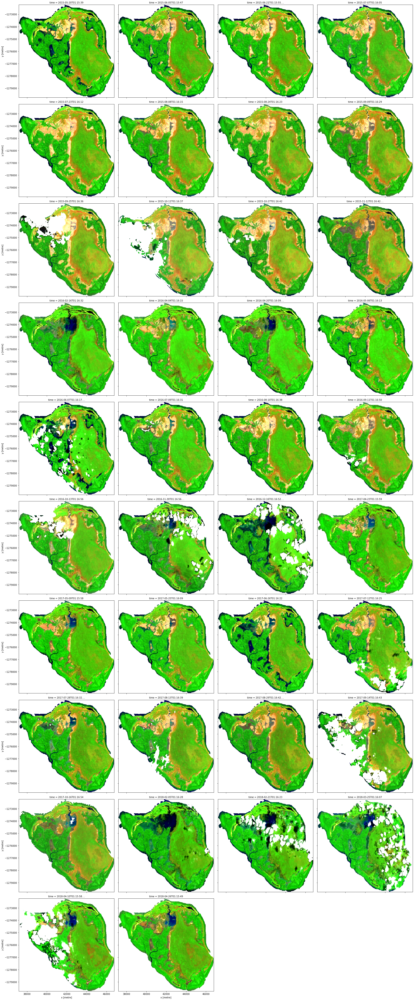

In [10]:
import DEAPlotting
DEAPlotting.rgb(ls578_ds, bands=['swir1', 'nir', 'green'], col='time',col_wrap=4)

In [11]:
#make the tasselled-cap transformation
import TasseledCapTools
tci = TasseledCapTools.thresholded_tasseled_cap(ls578_ds,wetness_threshold=-1200, drop=True , drop_tc_bands=False)

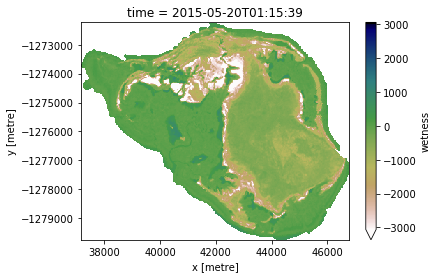

In [12]:
#show a wetness image
tcw=tci['wetness']
tcw.isel(time=0).plot(cmap='gist_earth_r', robust=True)

## Radar gather and preprocess

In [13]:
#Fang's de-speckling function

from scipy.ndimage import grey_dilation, grey_erosion
from scipy.ndimage.filters import uniform_filter
from scipy.ndimage.measurements import variance
from skimage.morphology import disk

def lee_filter(da, size):
    """
    Apply lee filter of specified window size.
    Adapted from https://stackoverflow.com/questions/39785970/speckle-lee-filter-in-python

    Option to fill negative pixel with grey_dilation
    """
    img = da.values
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2

    overall_variance = variance(img)

    img_weights = img_variance / (img_variance + overall_variance)
    img_output = img_mean + img_weights * (img - img_mean)
    
    return img_output


def denoise(ds, verbose = False, bands = None, fill_negative = True, remove_high = False):
    """
    Apply lee filter to a S1 dataset loaded from datacube.
    Keep nodata pixels as lee filter implemnation doesn't consider nan
    """
    if not bands: bands = list(ds.data_vars)    
    # save the nodata mask
    zero_mask = (ds==0).to_array().any(axis=0)
    nan_mask = (np.isnan(ds)).to_array().any(axis=0)
    nodata_mask = zero_mask | nan_mask
    ds = ds.where(~nodata_mask, 0)
    smoothed = ds[bands[0]].groupby('time').apply(lee_filter, size=7).to_dataset(name=bands[0])
    for band in bands[1:]: smoothed[band] = ds[band].groupby('time').apply(lee_filter, size=7)
        
    if fill_negative:
        # reduce impact of negative pixels
        for band in bands:
            dilated = smoothed[band].groupby('time').apply(grey_dilation, footprint=disk(3))
            smoothed[band] = smoothed[band].where(smoothed[band] > 0, dilated)

    if verbose:
        for band in bands: print("# of negative pixels in %s:"%band, (smoothed[band]<0).sum().values)

    if remove_high:
        # reduce extreme outliers 
        for band in bands:
            eroded = smoothed[band].groupby('time').apply(grey_erosion, size=(3,3))
            smoothed[band] = smoothed[band].where(smoothed[band] < eroded.max(), eroded)

    return smoothed.where(~nodata_mask)

In [300]:
#load the raw SAR scenes for the same polygon as the optical
sardata = dc.load(product='s1_gamma0_scene_v2', group_by='solar_day', output_crs='EPSG:3577',resolution=(25,25), **query)

In [307]:
#Denoise and mask the radar data with the actual polygon - it will have been returned as a rectangle
sardata=sardata.where(sardata!=0)
clean=denoise(sardata)
mask = rasterio.features.geometry_mask([geom.to_crs(sardata.geobox.crs)for geoms in [geom]],
                                           out_shape=sardata.geobox.shape,
                                           transform=sardata.geobox.affine,
                                           all_touched=False,
                                           invert=False)
clean=clean.where(~mask)

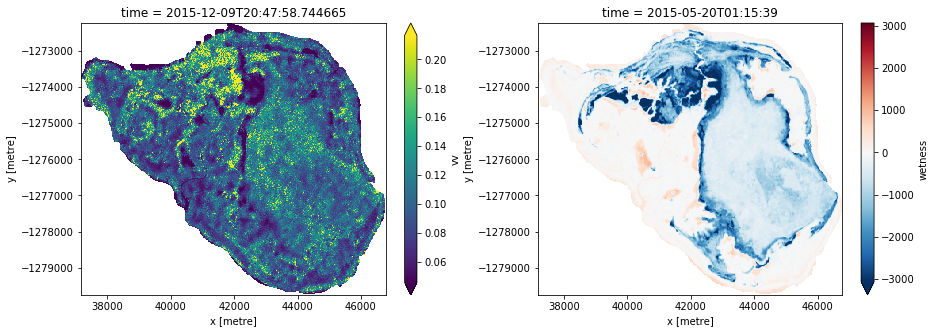

In [16]:
#plot cleaned SAR reflectance and TCW next to each other
fig, ax = plt.subplots(1, 2, figsize=(15,5))
clean.isel(time=0).vv.plot(ax=ax[0],robust=True)
tcw.isel(time=0).plot(ax=ax[1],robust=True)

In [17]:
#compute Pearson correlation coefficient (normalised covariance) between two datasets
#https://en.wikipedia.org/wiki/Pearson_correlation_coefficient
#xarrays automatically broadcast simple arithmetic operations (*,/,-) element-wise and deal with
#the polygon/cloudmasking so this works automatically
def pearson_corr(ds1,ds2):
    demean_prod = (ds1-ds1.mean())*(ds2-ds2.mean())
    cov = demean_prod.mean()
    return cov/(ds1.std()*ds2.std())

In [18]:
rad=clean.isel(time=0).vh
wet=tcw.isel(time=0)
pearson_corr(rad,wet)

<xarray.DataArray ()>
array(0.197972)

## Scatter plot wetness vs radar VV

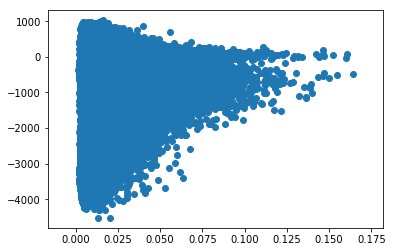

In [19]:
#Strip and flatten the data.
#Make sure xarray dimensions are sorted in the same order before converting to masked_array
rad=rad.sortby('y',ascending=False)
marad=rad.to_masked_array()
mawet=wet.to_masked_array()

#Both the wetness and radar must be unmasked for the resulting flattened array values to line up
flatrad=np.array(marad[np.logical_and(~marad.mask,~mawet.mask)])
flatwet=np.array(mawet[np.logical_and(~marad.mask,~mawet.mask)])

#ind=np.random.permutation(len(flatrad))
#flatrad=flatrad[ind[:500]]
#flatwet=flatwet[ind[:500]]

plt.scatter(flatrad,flatwet)

## Correlation throughout time

Make a 'matching' SAR DataArray to the TCW one by interpolating

In [20]:
sar_full = clean.vv
sar_int = sar_full.interp(time=tcw.time)
sar_int

<xarray.DataArray 'vv' (time: 38, y: 301, x: 384)>
array([[[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       ...,

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]],

       [[nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan],
        ...,
        [nan, nan, ..., nan, nan],
        [nan, nan, ..., nan, nan]]])
Coordinates:
  * y        (y) float64 -1.28e+06 -1.28e+06 -1.28e+06 ... -1.272e+06 -1.272e+06
  * x        (x) float64 3.719e+04 3.721e+04 3.724e+04 ... 4.674e+04 4.676e+04
  * time     (time) datetime64[ns] 2015-05-20T01:15:39 ... 2018-04-26T01:15:49

construct a heatmap of correlations

In [21]:
meansar = sar_int.mean(dim='time')
stdsar = sar_int.std(dim='time')
meanwet = tcw.mean(dim='time')
stdwet = tcw.std(dim='time')
pcorr = ((sar_int-meansar)*(tcw-meanwet)).mean(dim='time')/(stdsar*stdwet)

/g/data/v10/public/modules/dea-env/20190329/lib/python3.6/site-packages/xarray/core/nanops.py:159: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [22]:
#optical rgb geomedian for comparison
optical_geomedian=dcO.load(product='ls8_nbart_geomedian_annual',**query)
mask = rasterio.features.geometry_mask([geom.to_crs(optical_geomedian.geobox.crs)for geoms in [geom]],
                                           out_shape=optical_geomedian.geobox.shape,
                                           transform=optical_geomedian.geobox.affine,
                                           all_touched=False,
                                           invert=False)
optical_geomedian=optical_geomedian.where(~mask)

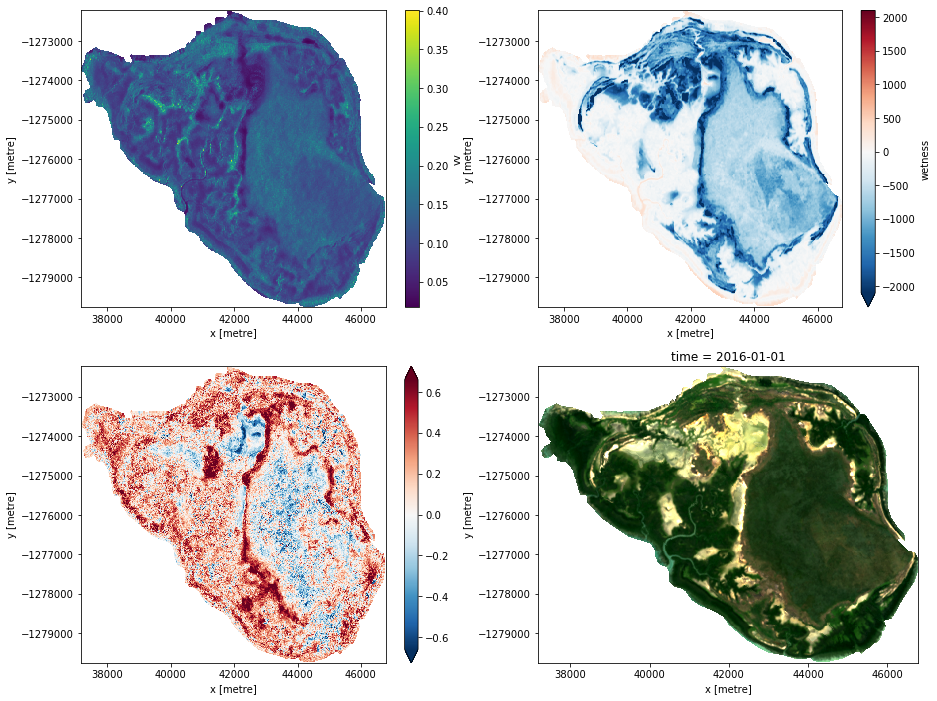

In [23]:
fig, ax = plt.subplots(2, 2, figsize=(15,12))
meansar.plot(ax=ax[0,0])
meanwet.plot(robust=True,ax=ax[0,1])
pcorr.plot(robust=True,ax=ax[1,0])
optical_geomedian[['red', 'green', 'blue']].isel(time=0).to_array().plot.imshow(robust=True,ax=ax[1,1])

In [24]:
#function to plot a scatter heatmap of two xarrays
def plot_heatmap(da1,da2,**kwargs):
    ma1=da1.to_masked_array()
    ma2=da2.to_masked_array()

    #Both arrays must be unmasked for the resulting flattened array values to line up and the heatmap to be valid
    f1=np.array(ma1[np.logical_and(~ma1.mask,~ma2.mask)])
    f2=np.array(ma2[np.logical_and(~ma1.mask,~ma2.mask)])

    heatmap, xedges, yedges = np.histogram2d(f1, f2, **kwargs)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

    plt.imshow(heatmap.T, extent=extent, aspect='auto', origin='lower')

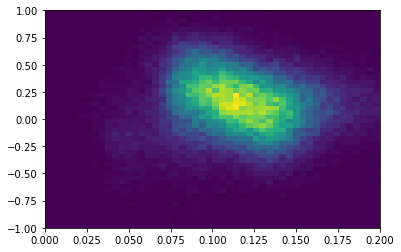

In [25]:
#Strip and flatten the data.
#Make sure xarray dimensions are sorted in the same order before plotting the heatmap
meansar=meansar.sortby('y',ascending=True)
plot_heatmap(meansar, pcorr, bins=50,range=[[0,0.2],[-1,1]])

In [26]:
print(pearson_corr(meansar,meanwet))

<xarray.DataArray ()>
array(0.114896)


/g/data/v10/public/modules/dea-env/20190329/lib/python3.6/site-packages/xarray/core/nanops.py:159: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


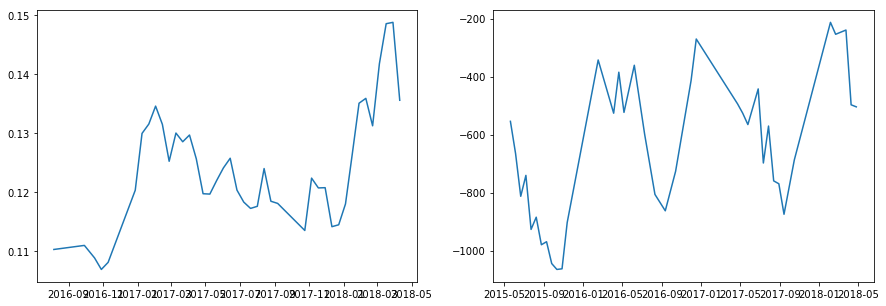

In [27]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

plt.sca(ax[0])
smoothsar = sar_full.rolling(time=3,center=True).mean()
plt.plot(smoothsar.time,smoothsar.mean(dim=['x','y']))

plt.sca(ax[1])
plt.plot(tcw.time,tcw.mean(dim=['x','y']))

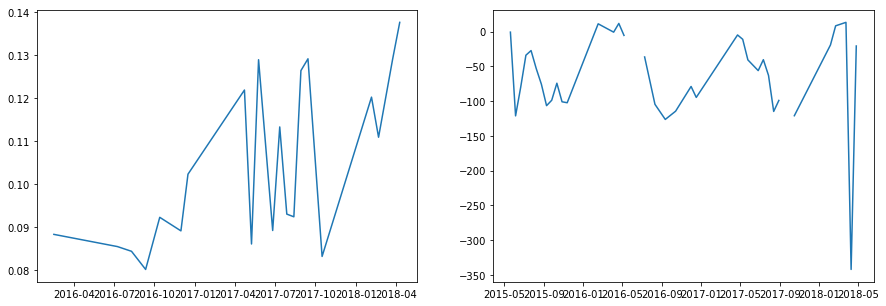

In [28]:
fig,ax = plt.subplots(1,2,figsize=(15,5))
pxs = sar_int.isel(x=150,y=150)
pxw = tcw.isel(x=150,y=150)

plt.sca(ax[0])
plt.plot(pxs.time,pxs)
plt.sca(ax[1])
plt.plot(pxw.time,pxw)

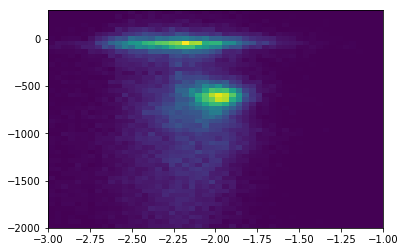

In [29]:
plot_heatmap(np.log(meansar), meanwet, bins=50,range=[[-3,-1],[-2000,300]])

In [32]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

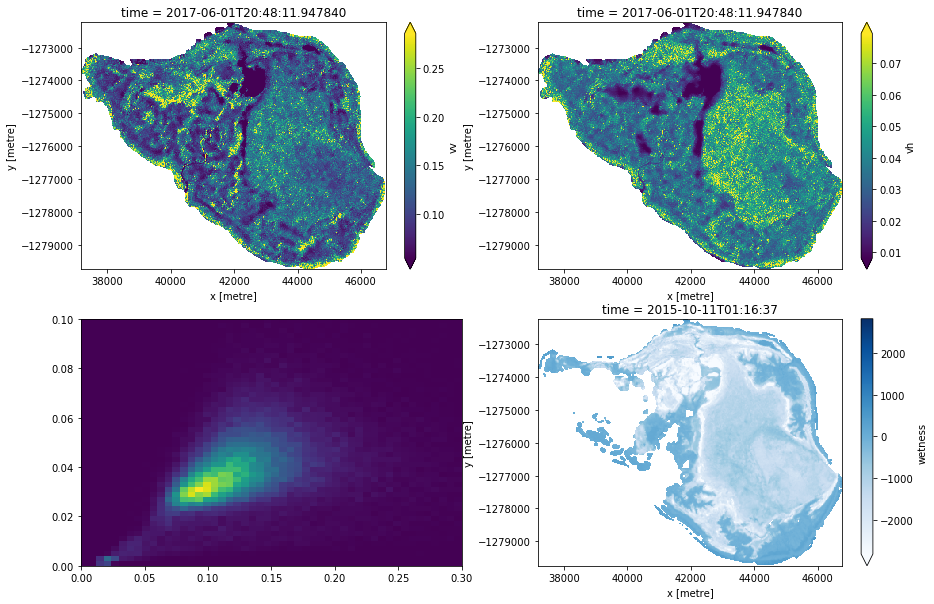

In [33]:
fig,ax=plt.subplots(2,2,figsize=(15,10))

single_sar = clean.isel(time=20).vv
single_sar2 = clean.isel(time=20).vh

single_wet = tcw.isel(time=9)

plt.sca(ax[0,0])
single_sar.plot(robust=True)

plt.sca(ax[0,1])
single_sar2.plot(robust=True)

plt.sca(ax[1,1])
single_wet.plot(robust=True,cmap='Blues')

plt.sca(ax[1,0])
plot_heatmap(single_sar, single_sar2, bins=50,range=[[0,0.3],[0,0.1]])

(array([9.590e+02, 8.790e+02, 8.110e+02, 7.530e+02, 7.470e+02, 7.030e+02,
        6.800e+02, 6.220e+02, 6.180e+02, 5.550e+02, 4.540e+02, 4.570e+02,
        3.570e+02, 3.540e+02, 3.650e+02, 3.980e+02, 3.050e+02, 3.460e+02,
        3.630e+02, 3.890e+02, 4.700e+02, 4.730e+02, 5.560e+02, 6.180e+02,
        8.450e+02, 1.145e+03, 1.582e+03, 1.935e+03, 1.746e+03, 9.380e+02,
        6.720e+02, 5.890e+02, 5.720e+02, 6.430e+02, 3.360e+02, 2.350e+02,
        1.620e+02, 1.010e+02, 7.100e+01, 9.400e+01, 3.000e+01, 2.300e+01,
        3.600e+01, 3.000e+01, 1.200e+01, 9.000e+00, 1.000e+00, 2.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00]),
 array([-1.00000000e+03, -9.66666667e+02, -9.33333333e+02, -9.00000000e+02,
        -8.66666667e+02, -8.33333333e+02, -8.00000000e+02, -7.66666667e+02,
        -7.33333333e+02, -7.00000000e+02, -6.66666667e+02, -6.33333333e+02,
        -6.00000000e+02, -5.66

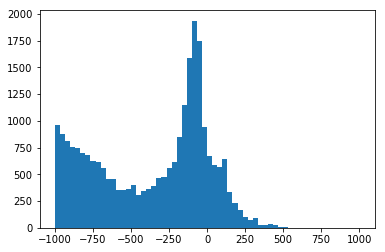

In [34]:
mawet=single_wet.to_masked_array()
flatwet=mawet[~mawet.mask]
plt.hist(flatwet,bins=60,range=[-1000,1000])

In [35]:
single_sar_all = clean.isel(time=20)
single_sar_all = single_sar_all.sortby('y',ascending=True)
single_wet = single_wet.sortby('y',ascending=True)

stacked_sar = single_sar_all.stack(z=['x','y'])
stacked_tcw = single_wet.stack(z=['x','y']).to_masked_array()

In [36]:
stacked_vv=stacked_sar.vv.to_masked_array()
stacked_vh=stacked_sar.vh.to_masked_array()

stacked_all = np.stack((stacked_vv,stacked_vh,stacked_tcw),axis=-1)


#k-means does not accept nan values
kminput = stacked_all[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))]



In [37]:
np.shape(kminput)

(56546, 3)

In [38]:
kmeans = KMeans(n_clusters=4).fit(kminput)

In [39]:
clustered = kmeans.labels_

#build the cluster labels back up to the correct shape with masking from the original xarray

ma=np.ma

maskclusters = ma.empty(np.shape(stacked_vv))

maskclusters[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))] = clustered
maskclusters.mask = ~np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))

In [40]:
import xarray as xr

In [41]:
#same coords as the original stacked DataArray
coords = stacked_sar['z']

cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

In [42]:
cluster_xr

<xarray.DataArray (z: 115584)>
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * z        (z) MultiIndex
  - x        (z) float64 3.719e+04 3.719e+04 3.719e+04 ... 3.719e+04 3.719e+04
  - y        (z) float64 -1.28e+06 -1.28e+06 -1.28e+06 ... -1.279e+06 -1.279e+06

In [43]:
labelled=cluster_xr.unstack().transpose('y','x')

In [44]:
centre_xy = kmeans.cluster_centers_.transpose()

In [45]:
#import colour mapping library and create a three-category map
from matplotlib import cm

colourmap = cm.get_cmap('Set2')

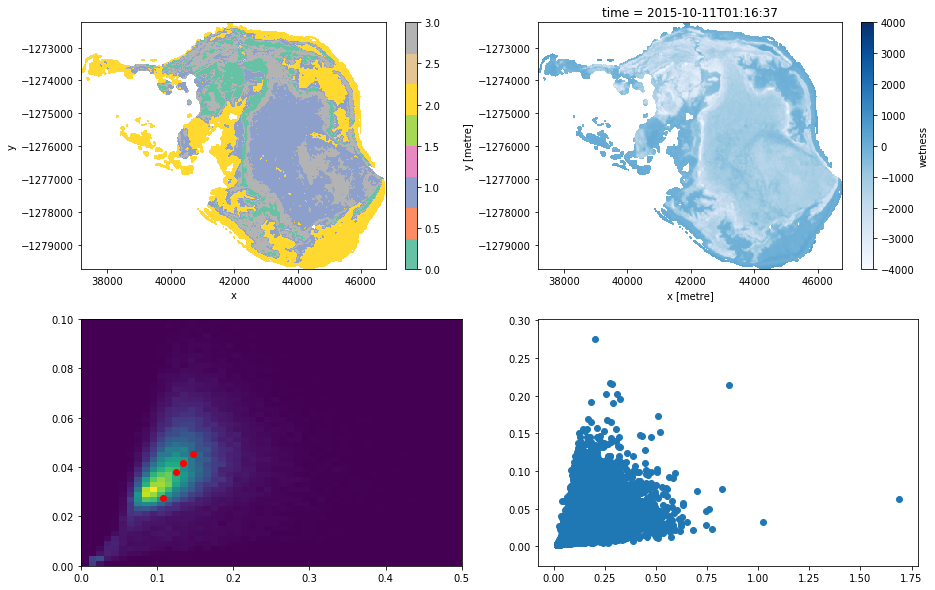

In [46]:
fig,ax=plt.subplots(2,2,figsize=(15,10))

plt.sca(ax[0,0])
labelled.plot(cmap=colourmap)

plt.sca(ax=ax[0,1])
single_wet.plot(cmap='Blues')

plt.sca(ax=ax[1,0])
plot_heatmap(single_sar_all.vv,single_sar_all.vh,bins=50,range=[[0,0.5],[0,0.1]])

#put those cluster centres in there
plt.plot(centre_xy[0],centre_xy[1],'ro')

plt.sca(ax=ax[1,1])
plt.scatter(single_sar_all.vv,single_sar_all.vh)



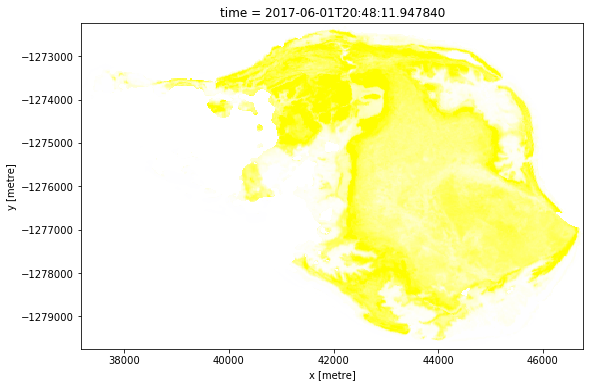

In [47]:
rgb_ds = single_sar_all.copy()
rgb_ds['wet'] = single_wet

DEAPlotting.rgb(rgb_ds, bands=['vv', 'vh', 'wet'],robust=True)

In [48]:
gm_stack = np.stack((stacked_vv,stacked_vh),axis=-1)
gm_input = gm_stack[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)]

In [49]:
gm_model=GaussianMixture(n_components=4).fit(gm_input)

In [50]:
import itertools
from scipy import linalg
import matplotlib as mpl

color_iter = itertools.cycle(['navy', 'c', 'cornflowerblue', 'gold',
                              'darkorange'])

#plot the means and variances of each gaussian component in the mixture

def plot_results(means, covariances, index, title):
    splot = plt.subplot(2, 1, 1 + index)
    for i, (mean, covar, color) in enumerate(zip(
            means, covariances, color_iter)):
        v, w = linalg.eigh(covar)
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        u = w[0] / linalg.norm(w[0])
        # as the DP will not use every component it has access to
        # unless it needs it, we shouldn't plot the redundant
        # components.
        
        
        # Plot an ellipse to show the Gaussian component
        angle = np.arctan(u[1] / u[0])
        angle = 180. * angle / np.pi  # convert to degrees
        ell = mpl.patches.Ellipse(mean, v[0], v[1], 180. + angle, color=color)
        ell.set_clip_box(splot.bbox)
        ell.set_alpha(0.5)
        splot.add_artist(ell)

    plt.xlim(0, 0.35)
    plt.ylim(0, 0.1)
    plt.title(title)

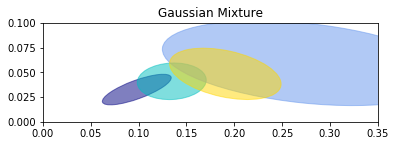

In [51]:
plot_results(gm_model.means_,gm_model.covariances_,0,'Gaussian Mixture')

In [52]:
clustered = gm_model.predict(gm_input)

In [53]:
#unstack and rebuild labels


maskclusters = ma.empty(np.shape(stacked_vv))

maskclusters[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)] = clustered
maskclusters.mask = ~np.logical_and(~stacked_vv.mask,~stacked_vh.mask)

#same coords as the original stacked DataArray
coords = stacked_sar['z']

cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

labelled=cluster_xr.unstack().transpose('y','x')

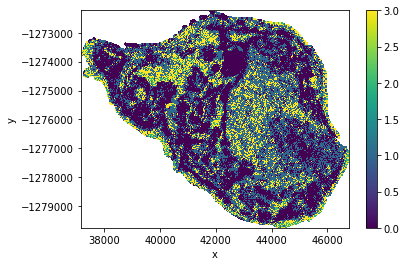

In [54]:
labelled.plot()

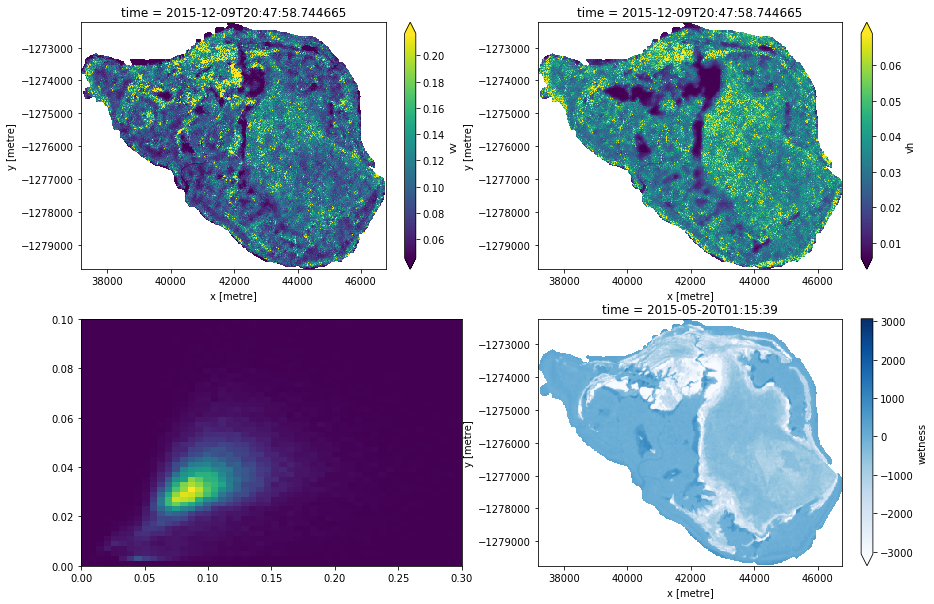

In [55]:
#dry season changes

fig,ax=plt.subplots(2,2,figsize=(15,10))

single_sar = clean.isel(time=0).vv
single_sar2 = clean.isel(time=0).vh

single_wet = tcw.isel(time=0)

plt.sca(ax[0,0])
single_sar.plot(robust=True)

plt.sca(ax[0,1])
single_sar2.plot(robust=True)

plt.sca(ax[1,1])
single_wet.plot(robust=True,cmap='Blues')

plt.sca(ax[1,0])
plot_heatmap(single_sar, single_sar2, bins=50,range=[[0,0.3],[0,0.1]])

In [56]:
single_sar_all = clean.isel(time=0)
single_sar_all = single_sar_all.sortby('y',ascending=True)


stacked_sar = single_sar_all.stack(z=['x','y'])

In [57]:
stacked_vv=stacked_sar.vv.to_masked_array()
stacked_vh=stacked_sar.vh.to_masked_array()

gm_stack = np.stack((stacked_vv,stacked_vh),axis=-1)
gm_input = gm_stack[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)]

clustered = gm_model.predict(gm_input)

#unstack and rebuild labels


maskclusters = ma.empty(np.shape(stacked_vv))

maskclusters[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)] = clustered
maskclusters.mask = ~np.logical_and(~stacked_vv.mask,~stacked_vh.mask)

#same coords as the original stacked DataArray
coords = stacked_sar['z']

cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

labelled=cluster_xr.unstack().transpose('y','x')

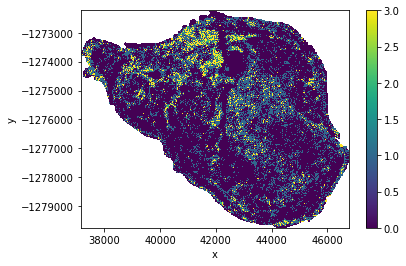

In [58]:
labelled.plot()

In [59]:
single_sar_all = clean.isel(time=0)
single_sar_all = single_sar_all.sortby('y',ascending=True)

single_wet=tcw.isel(time=0)


stacked_sar = single_sar_all.stack(z=['x','y'])


stacked_vv=stacked_sar.vv.to_masked_array()
stacked_vh=stacked_sar.vh.to_masked_array()

stacked_all = np.stack((stacked_vv,stacked_vh,stacked_tcw),axis=-1)


#Gaussian mixture input including the tasselled-cap wetness
gm_input = stacked_all[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))]

gmm = GaussianMixture(n_components=4).fit(gm_input)

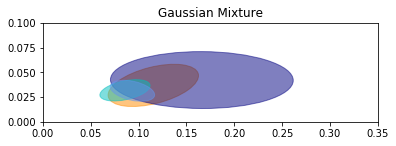

In [60]:
plot_results(gmm.means_,gmm.covariances_,0,'Gaussian Mixture')

In [61]:
clustered = gmm.predict(gm_input)

#unstack and rebuild labels


maskclusters = ma.empty(np.shape(stacked_vv))

maskclusters[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))] = clustered
maskclusters.mask = ~np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))

#same coords as the original stacked DataArray
coords = stacked_sar['z']

cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

labelled=cluster_xr.unstack().transpose('y','x')

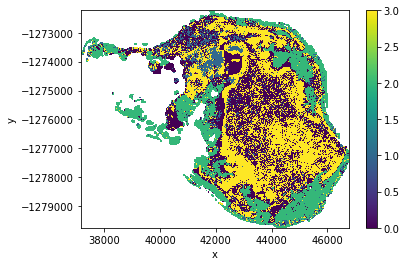

In [62]:
labelled.plot(robust=True)

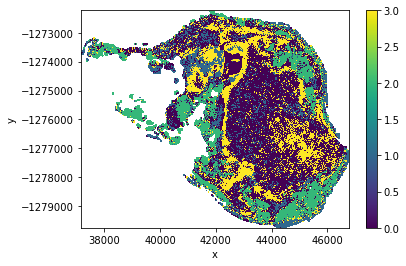

In [63]:
single_sar_all = clean.isel(time=20)
single_sar_all = single_sar_all.sortby('y',ascending=True)

single_wet=tcw.isel(time=9)


stacked_sar = single_sar_all.stack(z=['x','y'])


stacked_vv=stacked_sar.vv.to_masked_array()
stacked_vh=stacked_sar.vh.to_masked_array()

stacked_all = np.stack((stacked_vv,stacked_vh,stacked_tcw),axis=-1)


#Gaussian mixture input including the tasselled-cap wetness
gm_input = stacked_all[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))]

clustered = gmm.predict(gm_input)

#unstack and rebuild labels


maskclusters = ma.empty(np.shape(stacked_vv))

maskclusters[np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))] = clustered
maskclusters.mask = ~np.logical_and(~stacked_tcw.mask,np.logical_and(~stacked_vv.mask,~stacked_vh.mask))

#same coords as the original stacked DataArray
coords = stacked_sar['z']

cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

labelled=cluster_xr.unstack().transpose('y','x')

labelled.plot(robust=True)

## Functions to train the Gaussian-mixture model with SAR and plot each class over time

In [64]:
#gmm model fitter
def fit_gmm(sar_ds, n_components=4):
    #prepare the sar data in a format that suits the model
    gm_input = _sklearn_flatten(sar_ds)
    
    #fit the model to the data and return the fitted model
    return GaussianMixture(n_components=n_components).fit(gm_input)
    
#plot gmm classes for one step of dataset
def plot_gmm_classes(sar_ds,gmm):
    #prepare for prediction
    gm_input = _sklearn_flatten(sar_ds)
    
    gm_output = gmm.predict(gm_input)
    
    #rebuild the data array structure

    plottable = _reshape(gm_output,sar_ds)
    
    plottable.plot()

#'private' method to convert the sar data to a format suitable for fitting and
#predicting with sklearn
def _sklearn_flatten(sar_ds):
    stacked_sar = sar_ds.stack(z=['x','y'])
    
    stacked_vv = stacked_sar.vv.to_masked_array()
    stacked_vh = stacked_sar.vh.to_masked_array()

    stacked_both = np.stack((stacked_vv,stacked_vh),axis=-1)
    return stacked_both[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)]

#method to convert the flat output of a scikit-learn predict call to an xarray
#with compatible shape to the original input
def _reshape(output,sar_ds):
    
    stacked_sar = sar_ds.stack(z=['x','y'])
    
    stacked_vv = stacked_sar.vv.to_masked_array()
    stacked_vh = stacked_sar.vh.to_masked_array()
    
    maskclusters = ma.empty(np.shape(stacked_vv))

    maskclusters[np.logical_and(~stacked_vv.mask,~stacked_vh.mask)] = output
    maskclusters.mask = ~np.logical_and(~stacked_vv.mask,~stacked_vh.mask)

    #same coords as the original stacked DataArray
    coords = stacked_sar['z']

    cluster_xr = xr.DataArray(maskclusters, coords=[coords],dims=['z'])

    return cluster_xr.unstack().transpose('y','x')

In [65]:
sardry = clean.isel(time=23)
sarwet = clean.isel(time=36)
gmm = fit_gmm(sardry,n_components=4)

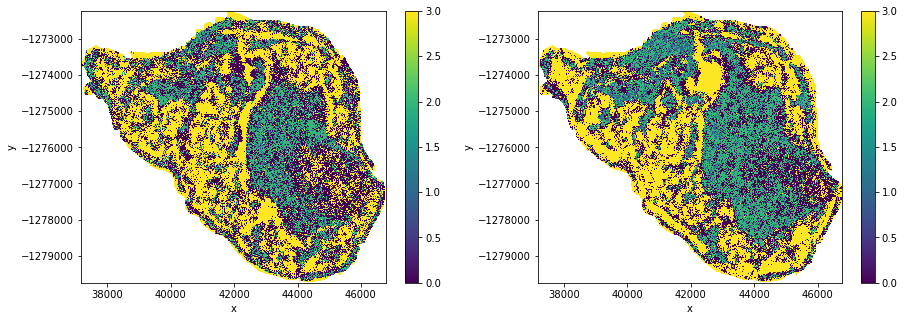

In [66]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

plt.sca(ax[0])
plot_gmm_classes(sardry,gmm)
plt.sca(ax[1])
plot_gmm_classes(sarwet,gmm)

In [89]:
#method to plot timeseries for each gmm class

def plot_gmm_timeseries(timeseries_ds,gmm):
    times = timeseries_ds['time']
    
    timeseries = np.empty([len(times),gmm.n_components])
    
    for i in range(len(times)):
        sar_ds = timeseries_ds.isel(time=i)
        gm_input = _sklearn_flatten(sar_ds)
        gm_output = gmm.predict(gm_input)
        timeseries[i] = [(gm_output == cat).sum() for cat in range(gmm.n_components)]
        timeseries[i] = timeseries[i]/len(gm_output)
    for cat in range(gmm.n_components):
        plt.plot(times,timeseries[:,cat])
    plt.show()
    return (times,timeseries)
    

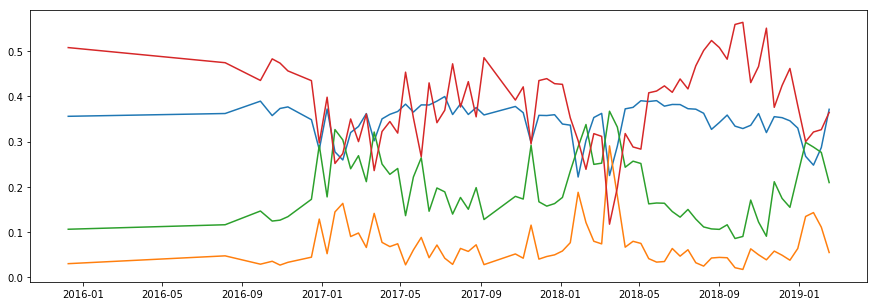

(<xarray.DataArray 'time' (time: 70)>
 array(['2015-12-09T20:47:58.744665000', '2016-08-05T20:48:06.983824000',
        '2016-09-28T20:47:26.963719000', '2016-10-16T20:48:08.960797000',
        '2016-10-28T20:48:09.113202000', '2016-11-09T20:48:08.861044000',
        '2016-12-15T20:48:07.847132000', '2016-12-27T20:48:07.593225000',
        '2017-01-08T20:48:05.998336000', '2017-01-20T20:48:05.560559000',
        '2017-02-01T20:48:05.326468000', '2017-02-13T20:48:05.084426000',
        '2017-02-25T20:48:05.012587000', '2017-03-09T20:48:05.066872000',
        '2017-03-21T20:48:08.515336000', '2017-04-02T20:48:08.945374000',
        '2017-04-14T20:48:09.469032000', '2017-04-26T20:48:09.781911000',
        '2017-05-08T20:48:10.732885000', '2017-05-20T20:48:11.288099000',
        '2017-06-01T20:48:11.947840000', '2017-06-13T20:48:12.673236000',
        '2017-06-25T20:48:13.446139000', '2017-07-07T20:48:13.937079000',
        '2017-07-19T20:48:14.602659000', '2017-07-31T20:48:15.508006000',


In [294]:
plt.subplots(1,1,figsize=(15,5))
plot_gmm_timeseries(clean,gmm)

In [69]:
clean['time']

<xarray.DataArray 'time' (time: 45)>
array(['2015-12-09T20:47:58.744665000', '2016-08-05T20:48:06.983824000',
       '2016-09-28T20:47:26.963719000', '2016-10-16T20:48:08.960797000',
       '2016-10-28T20:48:09.113202000', '2016-11-09T20:48:08.861044000',
       '2016-12-15T20:48:07.847132000', '2016-12-27T20:48:07.593225000',
       '2017-01-08T20:48:05.998336000', '2017-01-20T20:48:05.560559000',
       '2017-02-01T20:48:05.326468000', '2017-02-13T20:48:05.084426000',
       '2017-02-25T20:48:05.012587000', '2017-03-09T20:48:05.066872000',
       '2017-03-21T20:48:08.515336000', '2017-04-02T20:48:08.945374000',
       '2017-04-14T20:48:09.469032000', '2017-04-26T20:48:09.781911000',
       '2017-05-08T20:48:10.732885000', '2017-05-20T20:48:11.288099000',
       '2017-06-01T20:48:11.947840000', '2017-06-13T20:48:12.673236000',
       '2017-06-25T20:48:13.446139000', '2017-07-07T20:48:13.937079000',
       '2017-07-19T20:48:14.602659000', '2017-07-31T20:48:15.508006000',
       '2017-0

## Does the GMM generalise to other sites?

In [250]:
#load the real ginini
#Ginini Flats is at index 184 in this shapefile
ginini_flats=shapes[184]
GF_geometry=ginini_flats['geometry']
geom=geometry.Geometry(GF_geometry,crs=crs)
query = {'geopolygon': geom,
         'time': ('2015-05-01', '2019-01-01')
         }

#load the raw SAR scenes for the same polygon as the optical
sardata = dc.load(product='s1_gamma0_scene_v2', group_by='solar_day', output_crs='EPSG:3577',resolution=(25,25), **query)

#Denoise and mask the radar data with the actual polygon - it will have been returned as a rectangle
sardata=sardata.where(sardata!=0)
clean=denoise(sardata)
mask = rasterio.features.geometry_mask([geom.to_crs(sardata.geobox.crs)for geoms in [geom]],
                                           out_shape=sardata.geobox.shape,
                                           transform=sardata.geobox.affine,
                                           all_touched=False,
                                           invert=False)
clean=clean.where(~mask)

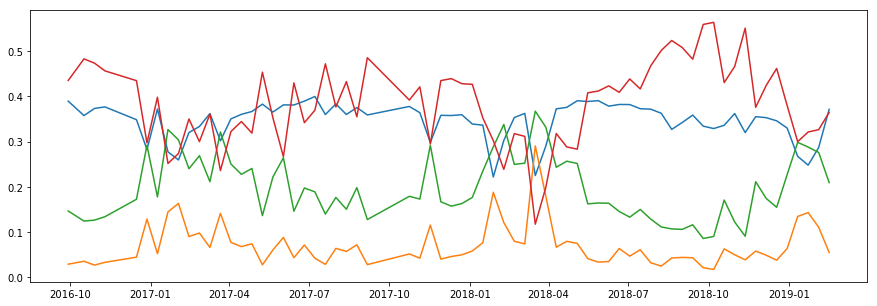

In [302]:
plt.subplots(1,1,figsize=(15,5))
t,ts=plot_gmm_timeseries(clean,gmm)

<xarray.DataArray 'time' ()>
array('2017-07-07T20:48:13.937079000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2017-07-07T20:48:13.937079
Attributes:
    units:    seconds since 1970-01-01 00:00:00
<xarray.DataArray 'time' ()>
array('2018-03-04T20:48:14.852769000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2018-03-04T20:48:14.852769
Attributes:
    units:    seconds since 1970-01-01 00:00:00


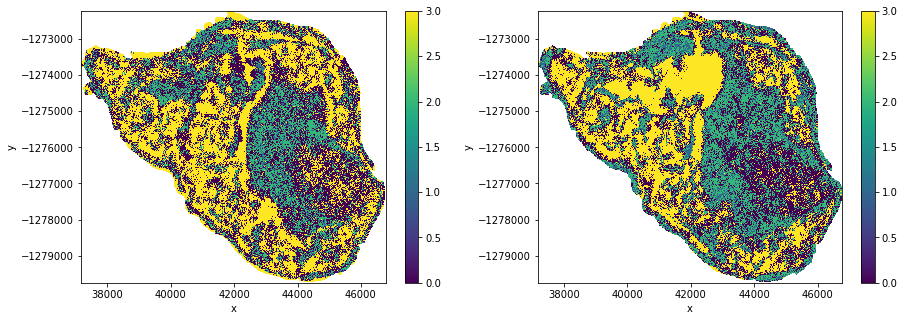

In [284]:
sardry = clean.isel(time=23)
print(sardry.time)
sarwet = clean.isel(time=40)
print(sarwet.time)

fig,ax = plt.subplots(1,2,figsize=(15,5))

plt.sca(ax[0])
plot_gmm_classes(sardry,gmm)
plt.sca(ax[1])
plot_gmm_classes(sarwet,gmm)

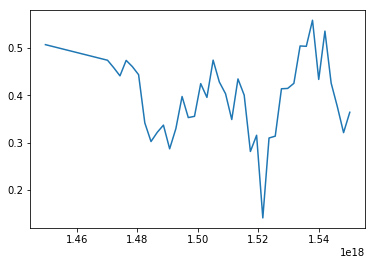

In [303]:
plt.plot(et,evensignal)

In [304]:
#Filter the signal with an order 4 Butterworth low-pass filter
from scipy import signal
from scipy import interpolate
#interpolate onto an even grid before filtering
et = np.linspace(float(t[0]),float(t[-1]),num=50)

ip = interpolate.interp1d([float(time) for time in t],ts[:,3])

evensignal = ip(et)

#the built-in resampler does weird things if the timesteps aren't even
#evensignal,et = signal.resample(ts[:,3],50,t=t.astype(float).to_masked_array())
#filter (forwards and backwards to avoid filter lag)
b,a = signal.butter(4,0.3)
filtsig = signal.filtfilt(b,a,evensignal)

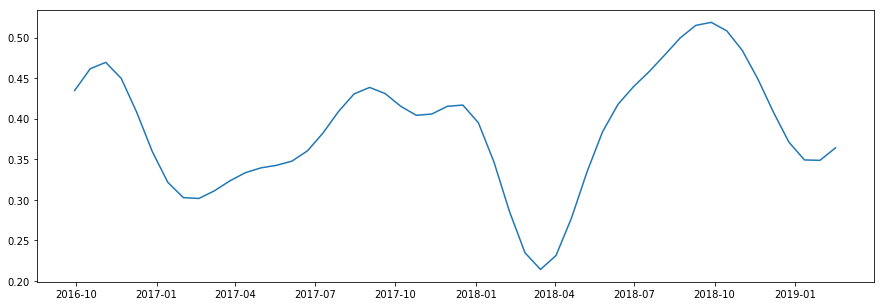

In [305]:
import datetime
plt.subplots(1,1,figsize=(15,5))
plttime = [datetime.datetime.fromtimestamp(tstamp/1e9) for tstamp in et]
plt.plot(plttime,filtsig)

In [282]:
et[-1]

1.524343696060435e+18

In [200]:
t.astype(float).to_masked_array()

masked_array(data=[1.449694078744665e+18, 1.470430086983824e+18,
                   1.475095646963719e+18, 1.476650888960797e+18,
                   1.477687689113202e+18, 1.478724488861044e+18,
                   1.481834887847132e+18, 1.482871687593225e+18,
                   1.483908485998336e+18, 1.484945285560559e+18,
                   1.485982085326468e+18, 1.487018885084426e+18,
                   1.488055685012587e+18, 1.489092485066872e+18,
                   1.490129288515336e+18, 1.491166088945374e+18,
                   1.492202889469032e+18, 1.493239689781911e+18,
                   1.494276490732885e+18, 1.495313291288099e+18,
                   1.49635009194784e+18, 1.497386892673236e+18,
                   1.498423693446139e+18, 1.499460493937079e+18,
                   1.500497294602659e+18, 1.501534095508006e+18,
                   1.502570896081449e+18, 1.503607696715993e+18,
                   1.504644497083518e+18, 1.508791698213262e+18,
                   1.50982